# Teaching models of computation

Dependencies for this notebook: `graphviz` executable installed on the system and on the path, [networkx](https://anaconda.org/anaconda/networkx)   and [graphviz python](https://anaconda.org/conda-forge/python-graphviz) anaconda packages. (See [here](https://graphviz.readthedocs.io/en/stable/index.html) for the documentation of the latter package.)

Please run the utility code at the bottom of this notebook first.

You should be able to upload this notebook to the JupyterHub instance on canvas.

__comment:__ In this notebook I use `x_17` and not `x17` for 3SAT and 3NAND formula to be more consistent with our notation for NAND. This is of course not very important.

 _Useful unicode symbols:_ φ   ∨   ∧   ¬   ≠    Ψ

In [1]:
# Some utility code
%pylab

Using matplotlib backend: Qt5Agg
Populating the interactive namespace from numpy and matplotlib


In [2]:
import graphviz
from graphviz import Graph
from graphviz import Digraph

import networkx as nx

import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

import warnings
warnings.filterwarnings("ignore")

import math

import pydotplus

def nxgraph(G):
    P = pydotplus.graph_from_dot_data(G.source)
    return nx.drawing.nx_pydot.from_pydot(P)

In a typical "Theory of Computation" course, one introduces the notion of computation by the following models:

1. **Deterministic Finite automata**, showing their equivalence to their non-deterministic variants and regular expressoins.

2. **Context Free Grammars** (sometimes showing their equivalence to pushdown automata)

3. **Turing machines**

For example, the first six chapters (until page 101) of the 1969 book [Formal languages and their relation to automata](https://dl.acm.org/citation.cfm?id=1096945) by Aho and Ullman are titled *Languages and their representations*, *Grammars*, *Finite automata and regular Grammars*, *Context Free Grammars*, *Pushdown Automata* and *Turing Machines*. The first three chapters (until page 187) of [Sipser's book](https://www.amazon.com/Introduction-Theory-Computation-Michael-Sipser/dp/113318779X) are called *Regular Languages*, *Context-Free Languages*, and *The Church-Turing Thesis* (which defined Turing machines and their variants).


The rationale behind using this sequence is that __(a)__ regular expressions and context free grammars are important and practically useful tools, __(b)__ These models are in some sense "simpler" than Turing Machines (they are definitely weaker) and so proving theorems about them can get students used to arguing about computational models, and __(c)__ There is an extremely well-written book by Sipser that makes teaching in this order easier for both instructors and students.


Yet, when I decided to redesign [Harvard's Theory of Computation course](http://www.boazbarak.org/cs121/schedule/) I decided to change this "standard sequence" in several ways.



### Reducing and deferring automata and context-free grammars

I do not start with automata, regular expressions and context free grammaers, and only discuss them  briefly and much later in the course, specifically *after* we talk about uncomputability. The reasons behind this are the following:

1. While Automata, Regular Expressions, and Context Free Grammars are useful topics in general, they are not central for modern theoretical computer science.

2. The main practical motivation for non-Turing complete models such as regular expressions and context-free grammar is best understood *after* you've seen uncomputability and the Halting problem. We use regular expression for search or context-free grammars for programming language syntax precisely because we don't want our computer to go into an infinite loop when we execute a query or try to check for syntax error. Historically, these formalisms were also introduced *after* Turing machines.

3. While doing simple proofs with automata and grammars certainly teaches students useful skills, this is by no means the only route to obtain those skills.

## Using programming language as the central model

Rather than talk about "machines" or "devices" such as automata or Turing machines, I prefer to focus on models that are based on _programming languages_.
I do this for several reasons:

1. I think programming languages are more intuitive and connected to the practice of computing for today's students, almost all of whom have programming experience.

2. Working with programming languages naturally lends itself to implementation such as a [website](http://www.nandpl.org/) where students can play with the computational models. Indeed this blog post itself is a Python Interactive Notebook, which you can play with here.

3. To demonstrate the power of our seemingly simple models we often show students results such as the equivalence of one tape and multi-tape Turing machines, or one dimensional and two dimensional tapes. In the context of programming languages, this corresponds to showing how we can implement **syntactic sugar** by compiling (or "transpiling") code that uses, for example, two dimensional arrays, into code that only has one-dimensional arrays. These textual transformations are more intuitive, and also correspond more closely to current computing practice.

4. Last but not least, one of the most important lessons of theory of computation is the **duality of code and data**, which means that we can think of our programs as simply strings of text that can be passed as input to other programs. This viewpoint is much more natural when our metaphor for computation is  computer code (which is a string) as opposed to a physical device such as a "machine". The universal machine becomes an _interpreter_: a concept that is again already familiar to many students.




## Our first model: Boolean Circuits

Rather than starting with automata, our first model is **Boolean circuits**.
This means that we don't have to talk about infinite functions.
However, Boolean circuits are rich enough to capture all our standard algorithms,
and moreover we can already talk about representing circuits as strings and feeding them as
input to other circuits.


Indeed, per the "programming language philosophy" above, we emphasize the _straightline program_ viewpoint of circuits, which automatically comes with a string representation.
In particular, this string representation makes the counting argument for circuit lower bounds almost trivial: the number of programs that can be described
by programs of $s$ characters over an alphabet $\Sigma$ is clearly at most $|\Sigma|^s$.

The circuit model  connects more easily to physical implementation of computing such as transistors and encoding 0's and 1's via electrical currents.
It also enables us to make mathematical sense of statements such as "this cryptosystem has $128$ bits of security" or assertions about quantum superiority via finite experiments.
Finally, starting with circuits puts us in a better shape for the proof of the Cook Levin Theorem.

To make life simpler, we choose one of the simplest universal bases for circuits, namely the basis consisting of the single function $NAND:\{0,1\}^2 \rightarrow \{0,1\}$ defined as $NAND(a,b)=\overline{a \wedge b}$.
Thus, our first model is a programming language where every line has the form
`foo := bar NAND blah` which corresponds to assigning to the variable `foo` the NAND of the values of the  variables `bar` and `blah`.

For example, this is the NAND program corresponding to the XOR function:

In [3]:
xor =r'''u   := x_0 NAND x_1
v   := x_0 NAND u
w   := x_1 NAND u
y_0 := v   NAND w
'''

For every assignment of the variables `x_0` and `x_1`, at the end of the execution the variable `y_0` will contain the XOR of these two variables.

It is very easy to write  five lines of Python code to evaluate a NAND program:

In [4]:
# return a list of triples of the form ('foo','bar','blah')
# for every line of the form 'foo := bar NAND blah'  in the program P
def lines(P):
    lineslist = [line.split() for line in P.rstrip('\n').split('\n')]
    return [(foo,bar,blah) for (foo,_,bar,_,blah) in lineslist ]

# Evaluate a NAND program P. 
# Update the table of variables with new values
def NANDEVAL(P, vals = {} ):
    for (foo,bar,blah) in lines(P):
        # foo gets NAND of bar and blah (default to 0 if not in table)
        vals[foo] = 1 - vals.get(bar,0)*vals.get(blah,0)
    return vals

Let's try this out

In [5]:
vals = NANDEVAL(xor,{'x_0':0,'x_1':1})
vals['y_0']

1

Straightline programs of course can be easily described as a circuit, with the transformation again being few lines of Python.

In [6]:
# Transform a NAND program P into a Boolean circuit (i.e. DAG)
# with NAND gates
def circuit(P):
    G = Digraph()
    vertices = {}
    line = 0
    for (foo,bar,blah) in lines(P):
        vtx = f'{line}){foo}'
        G.edge(vertices.get(bar,bar),vtx)
        G.edge(vertices.get(blah,blah),vtx)
        vertices[foo] = vtx
        line += 1
    return G

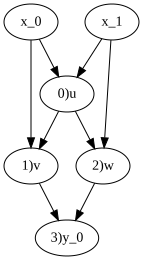

In [7]:
circuit(xor)

## Syntactic sugar

Both in theory and practice there is a tension between **expressiveness** and **simplicity** of computational models.
The model of NAND circuits (or equivalently, straightline programs) is pretty simple, but it can be shown to be expressive
via various _syntactic sugar_ transformations that show that we can implement concepts such as _loops_, _functions_, _if statements_, and more on top of it.
The website [nandpl.org](http://www.nandpl.org/) contains an "unsweetener" that can compile a NAND program with syntactic sugar constructs into an equivalent one that doesn't use them.
(We also have [OCaml](https://github.com/juan-esteller/NAND) and [Javascript](https://www.npmjs.com/package/nand-js) thanks to the wonderful work of my teaching fellows Juan Esteller and Gabe Montague).

For example, the following is a "sugared" version of a NAND program to compute the majority or "at least two" function
that on input three bits outputs 1 if and only if at least two of them are one.


In [8]:
atleasttwosweet=r'''def a := NOT(b) { 
  a := b NAND b
} 

def a :=  AND(b, c) {
  a := NOT(b NAND c) 
} 

def a := OR(b, c) { 
  a := NOT(b) NAND NOT(c) 
} 

def a := ATLEASTTWO(b, c, d) { 
  a := OR(AND(b, c), OR(AND(b, d), AND(c, d)))
}

y_0 := ATLEASTTWO(x_0, x_1, x_2) 
'''

And here is the "unsweetened" version, produced automatically:

In [9]:
atleasttwo =r'''upupunique_3 := x_0 NAND x_1
upunique_4 := upupunique_3 NAND upupunique_3
upupunique_3 := x_0 NAND x_2
upunique_5 := upupunique_3 NAND upupunique_3
upupunique_3 := x_1 NAND x_2
upunique_6 := upupunique_3 NAND upupunique_3
upupunique_0 := upunique_5 NAND upunique_5
upupunique_1 := upunique_6 NAND upunique_6
upunique_7 := upupunique_0 NAND upupunique_1
upupunique_0 := upunique_4 NAND upunique_4
upupunique_1 := upunique_7 NAND upunique_7
y_0 := upupunique_0 NAND upupunique_1
'''

In [10]:
NANDEVAL(atleasttwo,{'x_0':1,'x_1':0,'x_2':1})['y_0']

1

And the corresponding circuit:

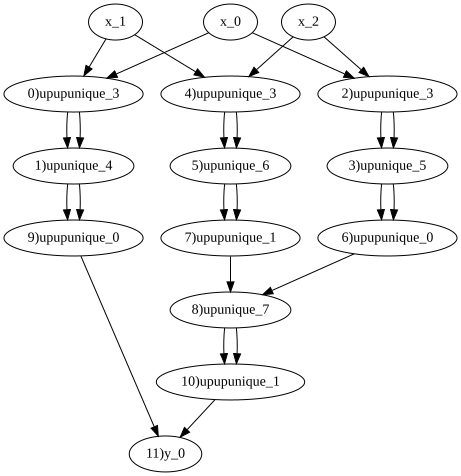

In [11]:
circuit(atleasttwo)

## Infinite functions and Turing Machines /  NAND++

To handle functions of unbounded inputs, we need to introduce __loops__.
We do so by simply having a special variable `loop` that, if it is set to $1$, the program goes back to the beginning.
To get the full power of Turing completeness we also need access to unbounded storage, which we do by allowing a special _index variable_ `i`.
If a line of code involves a variable `foo_i` then this is replaced by the current value of `i`.

You can think of `i` as corresponding to the "head" of a Turing machine's tape, and to get a model that is basically identical to a Turing machine one can then add operators that would increment and decrement `i`.
For convenience, we will not use such operations but rather have `i` proceed obliviously according to the schedule $0,1,0,1,2,1,0,1,2,3,2,1,0,1,2,\ldots$ (that one student referred to as an "infinite Sabbath elevator").
That is, at time period `t` the value of `i` is `index(t)` defined as follows:


In [12]:
# Returns the value of the index variable i in  iteration number k
def index(t):
    r = math.floor(math.sqrt(t+1/4)-1/2)
    return (t-r*(r+1) if t <= (r+1)*(r+1) else (r+1)*(r+2)-t)

[index(t) for t in range(20)]

[0, 1, 0, 1, 2, 1, 0, 1, 2, 3, 2, 1, 0, 1, 2, 3, 4, 3, 2, 1]

For example, this is a NAND++ program that computes the AND function:

In [13]:
andpp = r'''y_0 := flag NAND flag
notx   := x_i NAND x_i
nottmp := validx_i NAND notx
notflag  := flag NAND flag
flag := notflag NAND nottmp
halt := validx_i NAND validx_i
loop := halt NAND halt
'''

(The value `validx_`$j$ at some position $j$ is equal to $1$ if $j$ is smaller than the length of the input, and to $0$ otherwise. Such a marker is necessary to handle inputs of variable sizes.)

To evaluate a NAND++ program, we can use our NAND evaluator to repeatedly evaluate the corresponding NAND program until `loop` is false.

In [14]:
# Evaluate NAND++ program P on input x
def NANDPPEVAL(P,x):
    vals = {}
    for i in range(len(x)):
        vals[f'x_{i}'] = int(x[i])
        vals[f'validx_{i}'] = 1
    
    t = 0
    while True:
        vals = NANDEVAL(P.replace('_i',f'_{index(t)}'),vals)
        if not vals.get('loop',0): break
        t += 1
    
    return vals['y_0']

In [15]:
NANDPPEVAL(andpp,"111111")

1

The NAND++ model can be easily shown equivalent to Turing machines and other models such as the $\lambda$ calculus, and we do so in the lectures.

## RAM machines

When we refer to an $O(n^2)$ time algorithm in an algorithm class (or a whiteboard software development interview..), we don't mean running in $O(n^2)$ time on a Turing machine, but rather on a RAM model. I think it is important to convey the lesson that this can be made mathematically precise. Thus I also introduce a RAM variant which I call NAND<< (though am happy to consider suggestion for nicer names :) ). We show that this can be simulated up to polynomial overhead by NAND++/Turing machines, but use this for our formal definition of $TIME(T(n))$. One (very minor) advantage for the RAM model is that the unviersal machine only has a constant overhead, and so the time hierarchy theorem can be made tighter. Perhaps more significantly, this model is much closer to programming languages such as C/Python/JavaScript etc.. that students might be familiar with.

### "Dictionary" of computational models

To sum up, we have three main computational models in this course:

* __NAND programs__, which are the same as __Boolean circuits__ (with NAND gates)

* __NAND++ programs__, which are the same as __Turing Machines__ (with a single tape and oblivious head movement)

* __NAND<< programs__, which are the same as __RAM machines__


## The Cook Levin Theorem

One advantage of working with models that are so close to Boolean circuits, is that the proof of the Cook-Levin Theorem becomes much simpler. We prove it by showing that for every $L \in \mathbf{NP}$,

$$L \leq_p NANDSAT \leq_p 3NAND \leq_p 3SAT$$

where $NANDSAT$ is CIRCUITSAT for circuits with NAND gates, and $3NAND$ is like $3SAT$ except that the constraints are of the form $(x_i = x_j NAND x_k)$. 

The reduction of an arbitrary language/function in $\mathbf{NP}$ to $NANDSAT$ is almost trivial. It consists of taking a NAND++ program (think Turing machine) $P$, a time bound $T$, an instance $x\in \{0,1\}^n$ and a number $m$ corresponding to the  witness length, and mapping it into a NAND program (think circuit) $Q$ with $m$ inputs such that $Q(w)=P(xw)$ for every $w\in \{0,1\}^m$ (assuming $P$ does not need more than $T$ steps). 

In Python this is obtained by composing two steps:

1. "Unrolling the loop" to map a NAND++ program $P$ of $\ell$ lines and a time bound $T$ into a NAND program $Q$ of $T\ell$ lines that is obtained by simply "copy pasting" $T$ copies of $P$.

2. "Hardwiring the input" $x$ to the first $n$ inputs of $Q$ to obtain a program $Q_x$ such that $Q_x(w)=Q(xw)$.

In [16]:
# For "hardwiring" it is a sueful convention that we have variables "one" and "zero" that
# always have the values 1 and 0 respectively
def pref(P):
    return r'''notx_0 := x_0 NAND x_0
one := x_0 NAND notx_0
zero := one NAND one
'''+P

In [17]:
andpp = pref(andpp)
print(andpp)

notx_0 := x_0 NAND x_0
one := x_0 NAND notx_0
zero := one NAND one
y_0 := flag NAND flag
notx   := x_i NAND x_i
nottmp := validx_i NAND notx
notflag  := flag NAND flag
flag := notflag NAND nottmp
halt := validx_i NAND validx_i
loop := halt NAND halt



In [18]:
#Input: NAND++ "simple" prog P, time bound T, input length n
#Output: n-input NAND program of T|P| lines computing same function
def expand(P,T,n):
    result = ""
    for t in range(T):
        i=index(t)
        validx = ('one' if i<n else 'zero')
        result += P.replace('validx_i',validx).replace( '_i',f'_{i}')
    return result

In [19]:
# "hardwire" an input x to a NAND program Q
# return Q' s.t. Q'(y)=Q(xy)
def hardwire(Q,x):
    n = len(x)
    for i in range(n): Q = Q.replace(f'x_{i}',('one' if x[i]=='1' else 'zero'))
    
    for i in range(n,len(Q)): # move x_n,x_n+1,.... to x_0,x_1,...
        Q = Q.replace(f'x_{i}',f'x_{i-n}')
    return Q

In [20]:
# reduce F in NP to NANDSAT
# Input: x,T and and a NAND++ prog P s.t. 
#       F(x)=1 iff there exists y in {0,1}^m s.t. P(xy)=1 within T steps
# Output: Q s.t. NANDSAT(Q)=F(x)
def NP2NANDSAT_(P,T,m,x):
    Q = expand(P,T,len(x)+m)
    return hardwire(Q,x)

In [21]:
# This is the version of the function above that keeps track of y
# if it is given as extra input. Otherwise behaves identically.
#
# reduce F in NP to NANDSAT
# Input: x,T and and a NAND++ prog P s.t. 
#       F(x)=1 iff there exists y in {0,1}^m s.t. P(xy)=1 within T steps
# Output: Q s.t. NANDSAT(Q)=F(x)
def NP2NANDSAT(P,T,m,x,y=""):
    if y and len(y) != m: raise Exception
    Q = expand(P,T,len(x)+m)
    Q = hardwire(Q,x)
    return (Q,y) if y else Q

In [22]:
Q = NP2NANDSAT(andpp,17,3,"11")
NANDEVAL(Q,{'x_0':1,'x_1':1,'x_2':1})['y_0']

1

Now reducing from $NANDSAT$ to $3NAND$ is done in the same way we typically reduce a circuit to a formula: introduce a variable for each line.

In [23]:

# Clause list of a 3CNF/3NAND formula  φ
def getclauses(φ):
    clauses =  φ.split("∧")
    res = []
    for c in clauses:
        (v0,_,v1,_,v2) = c.strip()[1:-1].split()
        res.append((v0.strip(),v1.strip(),v2.strip()))
    return res
    

# number of variables of a formula φ
def numvars(φ):
    for n in range(len(φ)-1,0,-1):
        if φ.find(f'x_{n}')>= 0: return n+1
    raise Exception


In [24]:
# Reduce NANDSAT to 3NAND
# Input: NAND prog Q
# Output: 3NAND formula Ψ
#        s.t. Ψ satisfiable iff Q is
def NANDSAT23NAND_(Q):
    n = numvars(Q); m = len(Q); varidx = {}; Ψ = ''
    #varidx[u] is index corresponding to last value of u
    
    ZERO = n+2 # assume "zero" is written to in line 2
    
    for i in range(n): varidx[f'x_{i}'] = i # setup x_0...x_n-1
    
    # vars x_n ... x_n+m-1 correspond to lines
    j= n
    for line in Q.rstrip('\n').split('\n'): 
        (u,_,v,_,w) = line.split() # line is "u := v NAND w"
        
        #add constraint x_j = x_l NAND x_k, where k, l correspond to last     
        #lines v and w were written to
        Ψ += f"(x_{j} = x_{varidx.get(v,ZERO)} NAND x_{varidx.get(w,ZERO)}) ∧ "
        varidx[u] = j # update last line u is written to
        j += 1
    
    # output should be one
    Ψ += f'(x_{varidx["y_0"]} = x_{ZERO} NAND x_{ZERO})'
    
    return Ψ

Though of course the resulting formula can be quite big:

In [25]:
NANDSAT23NAND_(NP2NANDSAT_(andpp,17,3,"11"))

'(x_3 = x_5 NAND x_5) ∧ (x_4 = x_5 NAND x_3) ∧ (x_5 = x_4 NAND x_4) ∧ (x_6 = x_5 NAND x_5) ∧ (x_7 = x_4 NAND x_4) ∧ (x_8 = x_4 NAND x_7) ∧ (x_9 = x_5 NAND x_5) ∧ (x_10 = x_9 NAND x_8) ∧ (x_11 = x_4 NAND x_4) ∧ (x_12 = x_11 NAND x_11) ∧ (x_13 = x_4 NAND x_4) ∧ (x_14 = x_4 NAND x_13) ∧ (x_15 = x_14 NAND x_14) ∧ (x_16 = x_10 NAND x_10) ∧ (x_17 = x_14 NAND x_14) ∧ (x_18 = x_14 NAND x_17) ∧ (x_19 = x_10 NAND x_10) ∧ (x_20 = x_19 NAND x_18) ∧ (x_21 = x_14 NAND x_14) ∧ (x_22 = x_21 NAND x_21) ∧ (x_23 = x_14 NAND x_14) ∧ (x_24 = x_14 NAND x_23) ∧ (x_25 = x_24 NAND x_24) ∧ (x_26 = x_20 NAND x_20) ∧ (x_27 = x_24 NAND x_24) ∧ (x_28 = x_24 NAND x_27) ∧ (x_29 = x_20 NAND x_20) ∧ (x_30 = x_29 NAND x_28) ∧ (x_31 = x_24 NAND x_24) ∧ (x_32 = x_31 NAND x_31) ∧ (x_33 = x_24 NAND x_24) ∧ (x_34 = x_24 NAND x_33) ∧ (x_35 = x_34 NAND x_34) ∧ (x_36 = x_30 NAND x_30) ∧ (x_37 = x_34 NAND x_34) ∧ (x_38 = x_34 NAND x_37) ∧ (x_39 = x_30 NAND x_30) ∧ (x_40 = x_39 NAND x_38) ∧ (x_41 = x_34 NAND x_34) ∧ (x_42 = x_41 

In [26]:
# Version of input above that keeps track of satisfying assignment y if given
#
# Reduce NANDSAT to 3NAND
# Input: NAND prog Q
# Output: 3NAND formula Ψ
#        s.t. Ψ satisfiable iff Q is
def NANDSAT23NAND(Q,y=""):
    n = numvars(Q)
    m = len(Q.rstrip('\n').split('\n'))
    z = ["0"]*(m+n)
    varidx = {}
    Ψ = ''
    ZERO = n+2 # assume "zero" is written to in line 2
    
    for i in range(n): 
        varidx[f'x_{i}'] = i
        if y: z[i]=y[i]
    
    lastoutput = 0
    j= n
    for line in Q.rstrip('\n').split('\n'):
        if Ψ: Ψ += ' ∧ '
        (u,_,v,_,w) = line.split()
        if u=='y_0': lastoutput = j
        k = varidx.get(v,ZERO)
        l = varidx.get(w,ZERO)
        Ψ += f"(x_{j} = x_{k} NAND x_{l})"
        z[j] = "0" if z[k]=="1" and z[l]=="1" else "1"
        varidx[u] = j
        j += 1
    
    Ψ += f' ∧  (x_{lastoutput} = x_{ZERO} NAND x_{ZERO})'
    
    return  (Ψ, "".join(z)) if y else Ψ

Finally, reducing $3NAND$ to $3SAT$ just uses the fact that $a = b$  $NAND$ $c$  iff  $(\neg a \vee \neg b \vee \neg c) \wedge (a \vee b) \wedge (a \vee c)$

In [27]:
# Evaluate 3CNF φ on assignment x 
# Both are represented as strings
def evalcnf(φ,x):

    def varval(v):
        return (1-int(x[int(v[3:])])  if v[0]=="¬" else int(x[int(v[2:])]))
    
    for (v0,v1,v2) in getclauses(φ):
        # print(c+str([varval(v0),varval(v1),varval(v2)]))
        if not varval(v0)+varval(v1)+varval(v2): return False
    
    return True

# Clause list of a 3CNF φ
def getclauses(φ):
    clauses =  φ.split("∧")
    res = []
    for c in clauses:
        (v0,_,v1,_,v2) = c.strip()[1:-1].split()
        res.append((v0.strip(),v1.strip(),v2.strip()))
    return res
    

# number of variables of a formula φ
def numvars(φ):
    for n in range(len(φ)-1,0,-1):
        if φ.find('x_'+str(n))>= 0: return n+1
    raise Exception


In [28]:
# Reduce 3NAND to 3SAT
# Input: 3NAND formula Ψ
# Output: 3CNF formula φ
#        s.t.  φ satisfiable iff Ψ is
def NAND23SAT_(Ψ):
    φ = ""
    for (a,b,c) in getclauses(Ψ):
        φ += f'(¬{a} ∨ ¬{b} ∨ ¬{c}) ∧ ({a} ∨ {b}  ∨ {b})   ∧ ({a}  ∨  {c} ∨ {c})  ∧'
    return φ[:-1] # chop off redundant ∧

In [29]:
# Same as above but keeping track of assignment
def NAND23SAT(Ψ,y=""):
    φ = ""
    for (a,b,c) in getclauses(Ψ):
        φ += f'(¬{a} ∨ ¬{b} ∨ ¬{c}) ∧ ({a} ∨ {b}  ∨ {b})   ∧ ({a}  ∨  {c} ∨ {c})  ∧'
    return (φ[:-1],y) if y else φ[:-1] # chop off redundant ∧

We can plug on top of this the reductions from $3SAT$ to Independent Set and from Independent Set to Max Cut to get some pretty pictures. (To produce the figures below I use slightly modified versions of the reductions that are "Levin Reductions" in the sense that they keep track of the witness and use that to color the vertices  corresponding to the  independent set or maximum cut red.)

In [30]:
# Reduction φ ↦ G
def SAT2IS_(φ):
    n = numvars(φ) 
    G =Graph(engine='neato')
    
    # add pairs "x_i=0" and "x_i=1"
    for i in range(n): G.edge(f'x_{i}=0',f'x_{i}=1')
        
    # map "x_7" with index 5 to "5)x_7≠0", "¬x_12" with index 6 to "6)x_12≠1"
    def nodename(v,c): return str(c)+')'+(v[1:]+"≠1" if v[0]=="¬" else v+"≠0")
    
    #map "5)x_7≠0" to its neighbor "x_7=0"
    def neighbor(n):   return n.split(')')[1].split('≠')[0]+"="+n[-1]
    
    c = 0
    for C in getclauses(φ):
        (u,v,w) = (nodename(C[0],c),nodename(C[1],c+1),nodename(C[2],c+2))
        
        # add triangle of clause
        G.edges([(u,v),(v,w),(u,w)])
        
        # connect each vertex to inconsistent neighbor
        G.edges([(u,neighbor(u)),(v,neighbor(v)),(w,neighbor(w))])
        c += 3
    
    return G

In [31]:
# same reduction but taking care of colors and keeping track what happens to an assignment
def SAT2IS(φ,x=""):
    S = []
    n = numvars(φ) 
    G =Graph(engine='neato')
    for i in range(n):
        u = f"x_{i}=0"
        v = f"x_{i}=1"
        G.node(u,style='filled',fillcolor=('red' if x and x[i]=="0" else 'green'))
        G.node(v,style='filled',fillcolor=('red' if x and x[i]=="1" else 'green'))
        if x: S.append(u if x[i]=='0' else v)
        G.edge(u,v,len='1')
    
    def nodename(v):
        return ((v[1:],"≠1") if v[0]=="¬" else (v,"≠0"))
    
    cnum = 0
    for C in getclauses(φ):
        lastv = None
        found = False
        for v in C:
            (var,cond) = nodename(v)
            name = f'{cnum}){var}{cond}'
            cnum += 1
            color = 'lightblue'
            if x and (not found) and x[int(var[2:])]!=cond[1]:
                found = True
                color = 'red'
                S.append(name)
            G.node(name,label=var+cond,style='filled',fillcolor=color)
            if lastv: G.edge(lastv,name,len='1')
            lastv = name
            G.edge(name,var+"="+cond[1],len='1.7')
        G.edge(str(cnum-3)+")"+"".join(nodename(C[0])),lastv,len='1')
    
    return (G if not x else (G,S))

In [32]:
# same reduction as above but handling colors and showing the resulting cut when the original graph has independent set
def IS2MAXCUT(G,I=[]):
    G =nxgraph(G)
    S = []
    H =Graph(engine='sfdp',graph_attr={'overlap':'false'})
    H.node("source",style='filled',fillcolor='blue')
    S.append("source")
    for v in G.nodes():
        color = ('red' if I and v in I else 'lightblue')
        H.node(v,style='filled',fillcolor=color)
        ecol = 'black'
        pwidth = '1'
        if I and v in I: 
            S.append(v)
            ecol = 'red'
            pwidth = '2'
        H.edge("source",v,len="2",color=ecol,penwidth=pwidth) 
    
    j =0
    for (u,v) in G.edges():
        g1 = "e"+str(j)+"a"
        g2 = "e"+str(j)+"b"
        c1 = 'green'
        c2 = 'green'
        if I and (not u in I):
            c1 = 'red'
            S.append(g1)
        if I and (not v in I):
            c2 = 'red'
            S.append(g2)
        gadget = Graph("gadget"+str(j))
        gadget.node(g1,style='filled',fillcolor=c1)
        gadget.node(g2,style='filled',fillcolor=c2)
        gadget.edge(g1,g2,len="1",color=('red' if (g1 in S) != (g2 in I) else 'black'), penwidth=('2' if (g1 in S) != (g2 in I) else '1'))
        gadget.edge(u,g1,len="1", color=('red' if (g1 in S) != (u in I) else 'black'),penwidth =('2' if (g1 in S) != (u in S) else '1')  )
        gadget.edge(v,g2,len="1", color=('red' if (g2 in S) != (v in I) else 'black'),penwidth= ('2' if (g2 in S) != (v in S) else '1') )
        
        H.subgraph(gadget)
        H.edge(g1,"source",color=('red' if (g1 in S)  else 'black'),penwidth=('2' if (g1 in S)  else '1')) # ,len="2.5"
        H.edge(g2,"source",color=('red' if (g2 in S)  else 'black'),penwidth= ('2' if (g2 in S)  else '1') )
        j +=1
        
    
    return (H,S) if I else H

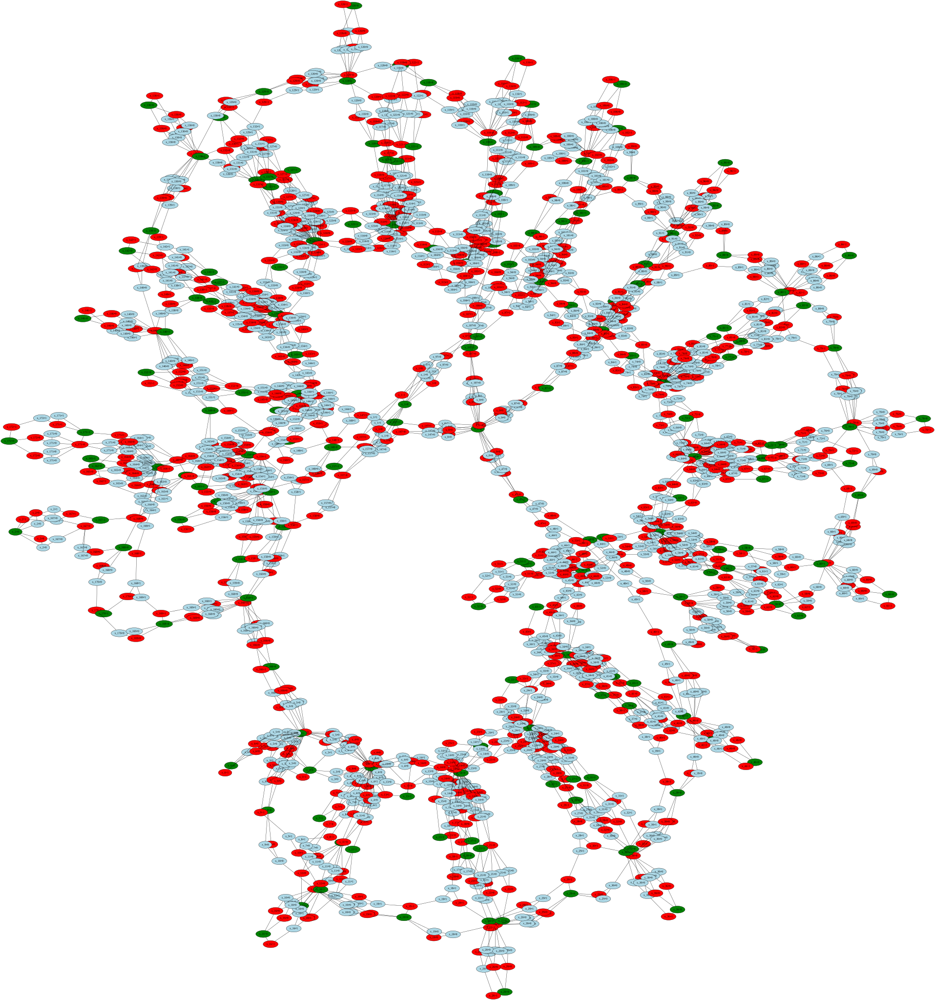

In [33]:
SAT2IS(*NAND23SAT(*NANDSAT23NAND(*NP2NANDSAT(andpp,17,3,"11","111"))))[0]

In [34]:
IS2MAXCUT(*SAT2IS(*NAND23SAT(*NANDSAT23NAND(*NP2NANDSAT(andpp,17,3,"11","111")))))[0]